# Dogs vs. Cats Redux: Kernels Edition

#### Импорт библиотек

In [ ]:
from typing import Dict, Optional, List
import glob
import os

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

import torch
import torchvision
import torch.nn as nn
import torch.utils.data as data

from PIL import Image
import tqdm.notebook as tqdm
import wandb
from IPython.display import clear_output

from sklearn.model_selection import train_test_split
from sklearn.metrics import log_loss

from scipy.optimize import minimize

### Посмотрим на данные

#### Баланс классов

In [49]:
cur_path = os.getcwd()

cats, dogs = [], []
for p in glob.glob(os.path.join(cur_path, 'data', 'train', '*')):
    fname = os.path.basename(p)
    if fname.startswith('cat'):
        cats.append(fname)
    elif fname.startswith('dog'):
        dogs.append(fname)

cats.sort()
dogs.sort()
cats_and_dogs = cats + dogs

len(cats), len(dogs)

(12500, 12500)

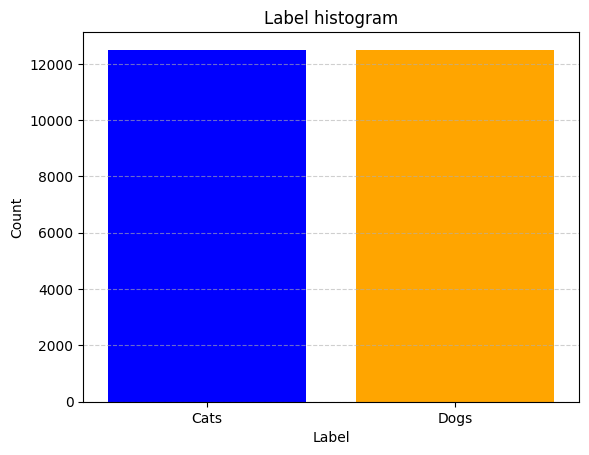

In [50]:
plt.bar([0, 1], [len(cats), len(dogs)], tick_label=['Cats', 'Dogs'], color=['blue', 'orange'])
plt.xlabel('Label')
plt.xticks([i for i in range(10)])
plt.ylabel('Count')
plt.xlim(-0.5, 1.5)
plt.title('Label histogram')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.show()

#### Размеры картинок

In [51]:
heights, widths, ratios = [], [], []
for fname in cats_and_dogs:
    image = os.path.join(cur_path, 'data', 'train', fname)
    img = plt.imread(image)
    height, width = img.shape[:2]
    heights.append(height)
    widths.append(width)
    ratios.append(width / height)

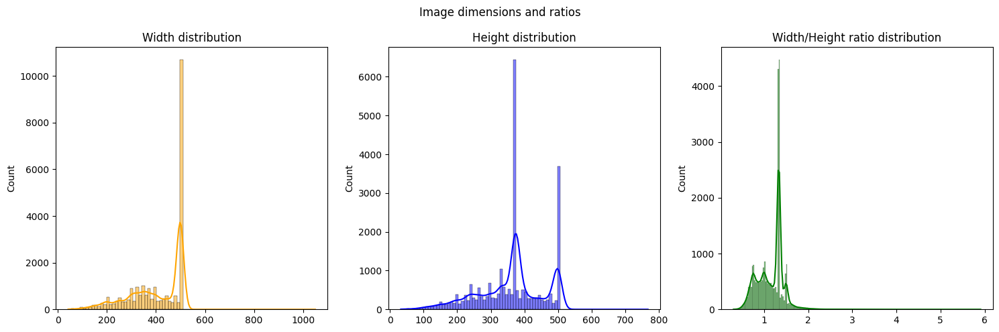

In [52]:
_, axes = plt.subplots(1, 3, figsize=(15, 5))
sns.histplot(widths, kde=True, ax=axes[0], color='orange')
axes[0].set_title('Width distribution')
sns.histplot(heights, kde=True, ax=axes[1], color='blue')
axes[1].set_title('Height distribution')
sns.histplot(ratios, kde=True, ax=axes[2], color='green')
axes[2].set_title('Width/Height ratio distribution')
plt.suptitle('Image dimensions and ratios')
plt.tight_layout()
plt.show()

#### Посмотрим на топ-5 экстремальных картинок разных типов

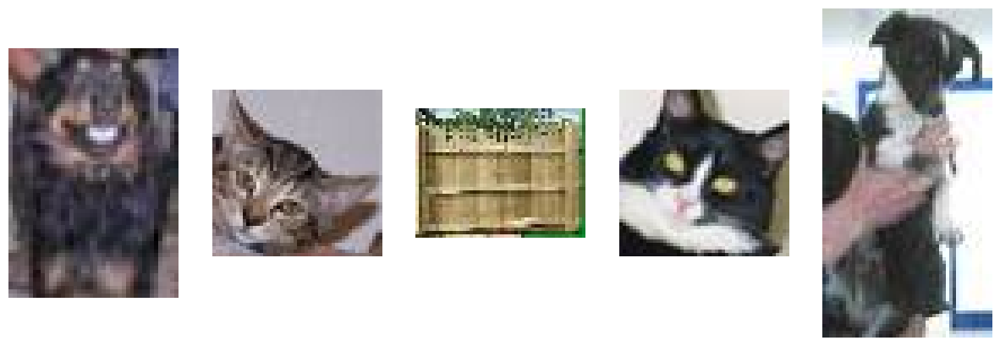

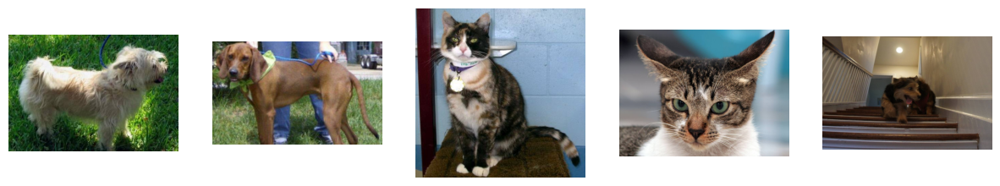

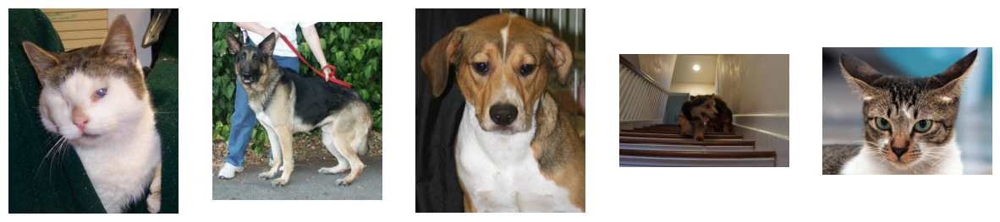

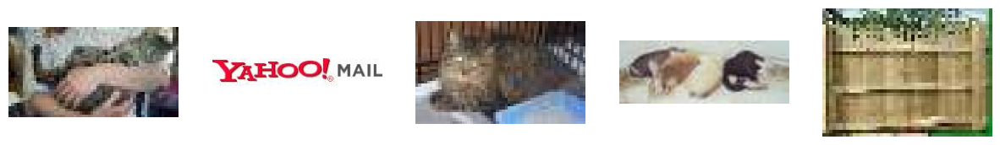

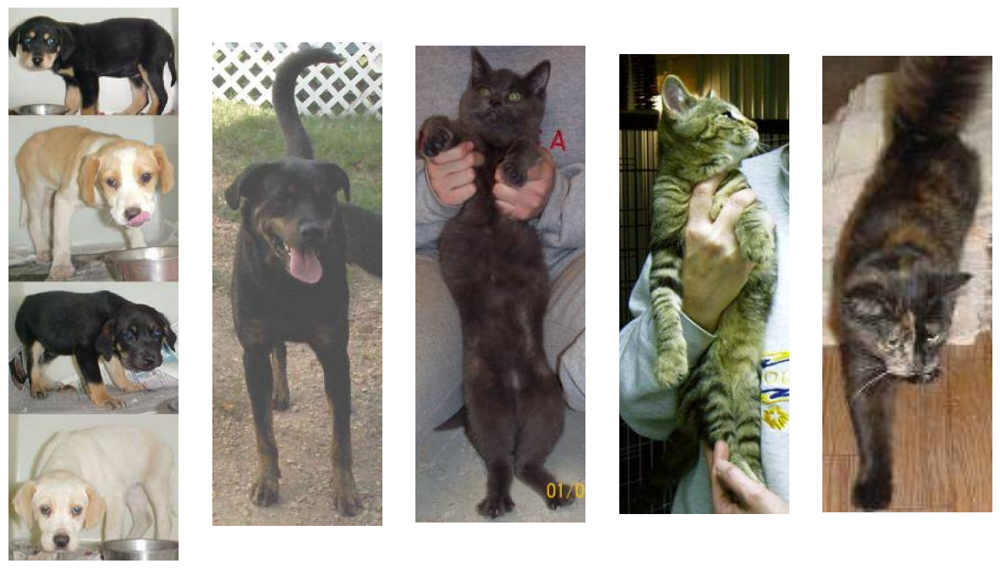

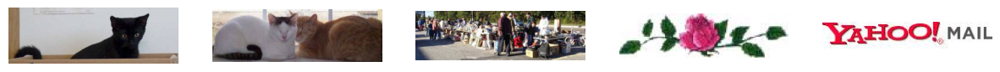

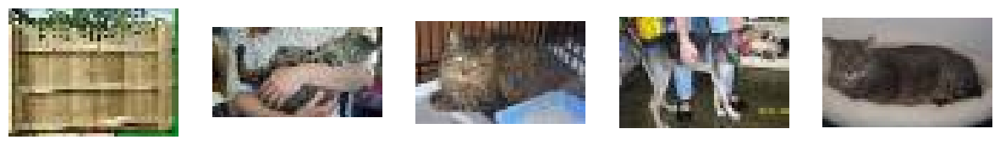

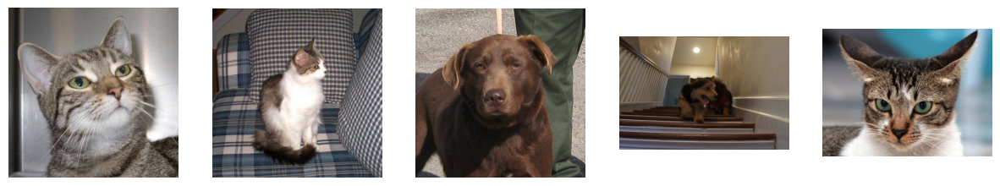

In [72]:
top5_narrow = np.argsort(widths)[:5]
top5_wide = np.argsort(widths)[-5:]
top5_tall = np.argsort(heights)[-5:]
top5_short = np.argsort(heights)[:5]
top5_ratios = np.argsort(ratios)[:5]
top5_ratios_inv = np.argsort(ratios)[-5:]
top5_smallest = np.argsort(np.array(heights) * np.array(widths))[:5]
top5_largest = np.argsort(np.array(heights) * np.array(widths))[-5:]

for top5 in [top5_narrow, top5_wide, top5_tall, top5_short, top5_ratios, top5_ratios_inv, top5_smallest, top5_largest]:
    _, axes = plt.subplots(1, 5, figsize=(15, 25))
    for ax, idx in zip(axes, top5):
        ax.imshow(plt.imread(os.path.join(cur_path, 'data', 'train', cats_and_dogs[idx])))
        ax.axis('off')

Не все картинки относятся к теме

### Создание датасета

In [ ]:
class CatsVsDogsDataset(data.Dataset):
    def __init__(self, root, filenames=None, transforms=None, train=True):
        super().__init__()
        self.root = os.path.join(root, 'train' if train else 'test')
        
        self.train = train
        self.transforms = transforms
        if filenames is None:
            filenames = glob.glob(os.path.join(self.root, '*'))
        else:
            if len(filenames) > 0 and not os.path.isabs(filenames[0]):
                filenames = [os.path.join(self.root, f) for f in filenames]

        filenames.sort()
        self.filenames = np.array(filenames)

        if self.train:
            self.labels = np.array([1 if 'dog' in f else 0 for f in self.filenames])
        else:
            self.labels = np.array([int(os.path.basename(f).split('.')[0]) for f in self.filenames])
    
    def __getitem__(self, index):
        fname = self.filenames[index]

        with Image.open(fname) as im:
            image = im.convert('RGB')

        if self.transforms is not None:
            image = self.transforms(image)
        
        return image, self.labels[index]
        
    def __len__(self):
        return len(self.filenames)

#### Трансформации и аугментации

In [193]:
train_transforms = torchvision.transforms.Compose([
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.RandomRotation(15),
    torchvision.transforms.RandomAutocontrast(),    
    torchvision.transforms.Resize((224, 224)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transforms = torchvision.transforms.Compose([
    torchvision.transforms.Resize((224, 224)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

root = os.path.join(cur_path, "data")
train_dir = os.path.join(root, "train")

all_files = sorted(glob.glob(os.path.join(train_dir, "*.jpg")))
all_labels = np.array([1 if os.path.basename(f).startswith("dog.") else 0 for f in all_files])

train_files, val_files = train_test_split(all_files, test_size=0.2, stratify=all_labels)

train_ds = CatsVsDogsDataset(root, filenames=train_files, transforms=train_transforms, train=True)
val_ds = CatsVsDogsDataset(root, filenames=val_files, transforms=val_transforms, train=True)

### Тренировочный и валидационный цикл

In [237]:
def training_epoch(model : nn.Module, optimizer : torch.optim.Optimizer, criterion : nn.Module, train_loader : data.DataLoader, device : torch.device, tqdm_desc="Train"):
    model.train()

    loss_sum = 0.0
    n_samples = 0
    correct_sum = 0

    pbar = tqdm.tqdm(train_loader, desc=tqdm_desc)
    for images, labels in pbar:
        images = images.to(device)
        labels = labels.to(device).float()

        optimizer.zero_grad(set_to_none=True)

        logits = model(images).squeeze()
        loss = criterion(logits, labels)

        loss.backward()
        optimizer.step()

        bs = images.size(0)
        loss_sum += float(loss.item()) * bs
        n_samples += bs

        with torch.no_grad():
            probs = torch.sigmoid(logits)
            preds = (probs > 0.5).float()
            c = (preds == labels).sum().item()
            correct_sum += c

        avg_loss = loss_sum / max(1, n_samples)
        avg_acc = correct_sum / max(1, n_samples)

        pbar.set_postfix({"loss": f"{avg_loss:.4f}", "acc": f"{avg_acc:.4f}"})

    return {"loss" : loss_sum / max(1, n_samples), "acc" : correct_sum / max(1, n_samples)}


@torch.no_grad()
def validation_epoch(model : nn.Module, criterion : nn.Module, valid_loader : data.DataLoader, device : torch.device, tqdm_desc="Valid"):
    model.eval()

    loss_sum = 0.0
    n_samples = 0
    correct_sum = 0

    pbar = tqdm.tqdm(valid_loader, desc=tqdm_desc)
    for images, labels in pbar:
        images = images.to(device)
        labels = labels.to(device).float()

        logits = model(images).squeeze()
        loss = criterion(logits, labels)

        bs = images.size(0)
        loss_sum += float(loss.item()) * bs
        n_samples += bs

        probs = torch.sigmoid(logits)
        preds = (probs > 0.5).float()
        c = (preds == labels).sum().item()
        correct_sum += c

        avg_loss = loss_sum / max(1, n_samples)
        avg_acc = correct_sum / max(1, n_samples)
        pbar.set_postfix({"loss": f"{avg_loss:.4f}", "acc": f"{avg_acc:.4f}"})

    return {"loss" : loss_sum / max(1, n_samples), "acc" : correct_sum / max(1, n_samples)}

def plot_metrics(train_losses, val_losses, train_acc, val_acc):
    clear_output(True)
    epochs = np.arange(1, len(train_losses) + 1)

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label="Train Loss", marker="o")
    plt.plot(epochs, val_losses, label="Val Loss", marker="o")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Loss Dynamics")
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_acc, label="Train Accuracy", marker="o")
    plt.plot(epochs, val_acc, label="Val Accuracy", marker="o")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title("Accuracy Dynamics")
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.legend()

    plt.tight_layout()
    plt.show()

def save_checkpoint(path: str, model: nn.Module, optimizer: torch.optim.Optimizer, epoch: int, best_val_loss: float) -> None:
    os.makedirs(os.path.dirname(path), exist_ok=True)
    ckpt = {
        "epoch": epoch,
        "best_val_loss": best_val_loss,
        "model_state": model.state_dict(),
        "optimizer_state": optimizer.state_dict(),
    }
    torch.save(ckpt, path)

def fit(model : nn.Module, train_loader : data.DataLoader, val_loader : data.DataLoader, optimizer : torch.optim.Optimizer, criterion : nn.Module, device : torch.device, num_epochs: int, scheduler: Optional[object] = None, out_dir: str = "models", plot_fn=None, use_wandb: bool = False, wandb_project: str = "dogs-vs-cats", wandb_run_name: Optional[str] = None, wandb_config: Optional[dict] = None) -> Dict[str, List[float]]:
    model.to(device)

    history = {
        "train_loss": [],
        "train_acc": [],
        "val_loss": [],
        "val_acc": [],
        "lr": [],
    }

    best_val_loss = float("inf")
    best_path = os.path.join(out_dir, "best.pt")
    os.makedirs(out_dir, exist_ok=True)

    run = None
    if use_wandb:
        run = wandb.init(
            project=wandb_project,
            name=wandb_run_name,
            config=wandb_config or {},
        )
        wandb.config.update({
            "num_params": sum(p.numel() for p in model.parameters()),
            "device": str(device),
        }, allow_val_change=True)

    for epoch in range(1, num_epochs + 1):
        tr = training_epoch(model=model, train_loader=train_loader, optimizer=optimizer, criterion=criterion, device=device, tqdm_desc=f"Train {epoch}/{num_epochs}")
        va = validation_epoch(model=model, valid_loader=val_loader, criterion=criterion, device=device, tqdm_desc=f"Valid {epoch}/{num_epochs}",)
        lr = optimizer.param_groups[0]["lr"]

        history["train_loss"].append(tr['loss'])
        history["train_acc"].append(tr['acc'])
        history["val_loss"].append(va['loss'])
        history["val_acc"].append(va['acc'])
        history["lr"].append(lr)

        if scheduler is not None:
            try:
                scheduler.step(va['loss'])
            except TypeError:
                scheduler.step()

        save_checkpoint(os.path.join(out_dir, f"epoch_{epoch:03d}.pt"),model, optimizer, epoch, best_val_loss)

        is_best = va['loss'] < best_val_loss
        if is_best:
            best_val_loss = va['loss']
            save_checkpoint(best_path, model, optimizer, epoch, best_val_loss)

        print(
            f"[{epoch:02d}/{num_epochs}] "
            f"train: loss={tr['loss']:.4f}, acc={tr['acc']:.4f} | "
            f"val: loss={va['loss']:.4f}, acc={va['acc']:.4f} | "
            f"lr={lr:.2e} | best_val_loss={best_val_loss:.4f}"
        )

        
        if plot_fn is not None:
            plot_fn(history["train_loss"], history["val_loss"], history["train_acc"], history["val_acc"])

        if use_wandb:
            wandb.log({
                "epoch": epoch,
                "train/loss": tr['loss'],
                "train/acc": tr['acc'],
                "val/loss": va['loss'],
                "val/acc": va['acc'],
                "lr": lr,
                "best/val_loss": best_val_loss,
                "best/is_best": int(is_best),
            }, step=epoch)

            if is_best:
                wandb.save(best_path)

    if use_wandb and run is not None:
        run.finish()

    return history

### Baseline: Предобученный ResNet50

In [238]:
class CatsVsDogsModel(nn.Module):
    def __init__(self, weights=torchvision.models.ResNet50_Weights.IMAGENET1K_V2, freeze_backbone=True):
        super().__init__()

        self.backbone = torchvision.models.resnet50(weights=weights)
        in_features = self.backbone.fc.in_features
        self.backbone.fc = nn.Linear(in_features, 1)

        if freeze_backbone:
            for p in self.backbone.parameters():
                p.requires_grad = False
            for p in self.backbone.fc.parameters():
                p.requires_grad = True

    def forward(self, x):
        return self.backbone(x)

In [ ]:
wandb_config = {
    "project": "dogs-vs-cats-redux",
    "run_type": "train",
    "seed": 42,

    "dataset": "dogs-vs-cats-redux",
    "split": {
        "type": "stratified",
        "val_size": 0.2,
        "random_state": 42,
    },

    "img_size": 224,
    "normalize": {
        "mean": [0.485, 0.456, 0.406],
        "std":  [0.229, 0.224, 0.225],
        "source": "imagenet",
    },
    "train_aug": {
        "hflip_p": 0.5,
        "rotation_deg": 15,
        "autocontrast_p": 0.5,
        "resize": [224, 224],
    },
    "val_aug": {
        "resize": [224, 224],
    },

    "model": {
        "arch": "resnet50",
        "weights": "IMAGENET1K_V2",
        "head_out": 1,
        "freeze_backbone": True,
        "trainable_params": "fc_only",
    },

    "device": "mps",
    "epochs": 15,
    "batch_size": 32,

    "optimizer": {
        "name": "AdamW",
        "lr": 1e-3,
        "weight_decay": 1e-4,
        "betas": [0.9, 0.999],
        "eps": 1e-8,
    },
    "criterion": "BCEWithLogitsLoss",

    "scheduler": {
        "name": "ReduceLROnPlateau",
        "mode": "min",
        "monitor": "val/loss",
        "factor": 0.5,
        "patience": 2,
    },

    "log": {
        "log_every_epoch": True,
        "save_best": True,
        "checkpoint_dir": "models",
    },
}

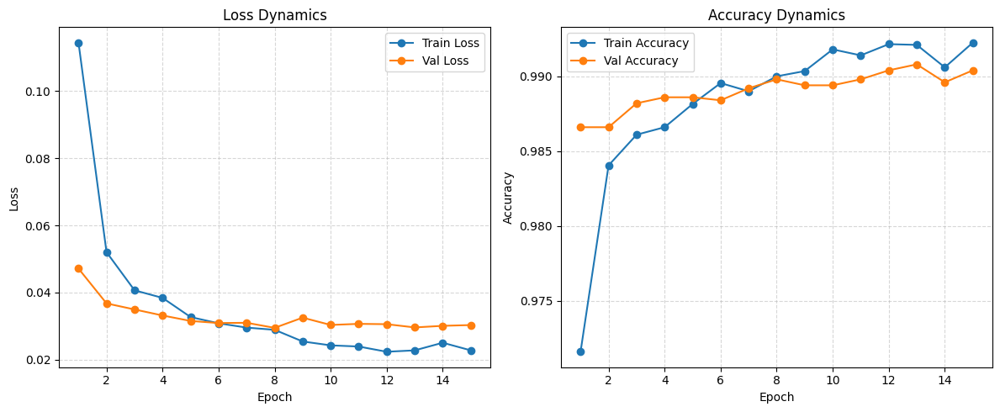

best/is_best,██████▁█▁▁▁▁▁▁▁
best/val_loss,█▄▃▂▂▂▂▁▁▁▁▁▁▁▁
epoch,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
lr,███████████▃▃▃▁
train/acc,▁▅▆▆▇▇▇▇▇████▇█
train/loss,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁
val/acc,▁▁▄▄▄▄▅▆▆▆▆▇█▆▇
val/loss,█▄▃▂▂▂▂▁▂▁▁▁▁▁▁
best/is_best,0
best/val_loss,0.02947
epoch,15


In [240]:
model = CatsVsDogsModel()
train_loader = data.DataLoader(train_ds, batch_size=32, shuffle=True)
val_loader = data.DataLoader(val_ds, batch_size=32, shuffle=False)
optimizer = torch.optim.AdamW(model.backbone.fc.parameters(), lr=1e-3, weight_decay=1e-4)
criterion = nn.BCEWithLogitsLoss()
device = torch.device("mps")
num_epochs = 15
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2)

history = fit(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    optimizer=optimizer,
    criterion=criterion,
    device=device,
    num_epochs=num_epochs,
    scheduler=scheduler,
    plot_fn=plot_metrics,
    use_wandb=True,
    wandb_project="dogs-vs-cats-redux",
    wandb_run_name="resnet50-fc-only-run1",
    wandb_config=wandb_config
)

In [243]:
model = CatsVsDogsModel()
model.load_state_dict(torch.load("models/best.pt")["model_state"])
model.to(torch.device('cpu'))
model.eval();

### Посмотрим на ошибки

In [285]:
val_probs, val_targets, val_logits = [], [], []
with torch.no_grad():
    for image, label in val_ds:
        image = image.unsqueeze(0)
        logit = model(image)
        val_logits.append(logit.item())
        prob = torch.sigmoid(logit).item()
        val_probs.append(prob)
        val_targets.append(label.item())

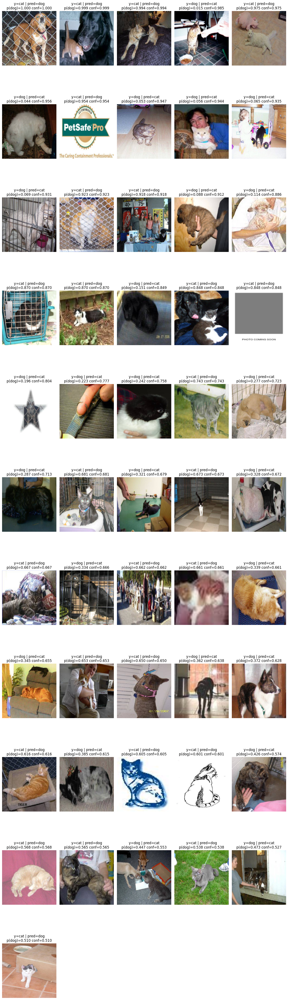

In [286]:
val_preds = np.array([1 if p > 0.5 else 0 for p in val_probs])
val_targets = np.array(val_targets)
val_probs = np.array(val_probs)
val_logits = np.array(val_logits)

wrong_indices = np.where(val_preds != val_targets)[0]
wrong_probs = val_probs[wrong_indices]
wrong_targets = val_targets[wrong_indices]
wrong_preds = val_preds[wrong_indices]
wrong_images = [val_ds[idx][0] for idx in wrong_indices]

wrong_conf = np.maximum(wrong_probs, 1.0 - wrong_probs)

topk = len(wrong_indices)
top_idx_local = np.argsort(-wrong_conf)[:topk]
top_wrong_indices = wrong_indices[top_idx_local]

top_wrong_probs = val_probs[top_wrong_indices]
top_wrong_targets = val_targets[top_wrong_indices]
top_wrong_preds = val_preds[top_wrong_indices]
top_wrong_conf = np.maximum(top_wrong_probs, 1 - top_wrong_probs)

mean = torch.tensor([0.485, 0.456, 0.406])[:, None, None]
std = torch.tensor([0.229, 0.224, 0.225])[:, None, None]

def denorm(x):
    return (x * std + mean).clamp(0, 1)

plt.figure(figsize=(14, 50))
for i, idx in enumerate(top_wrong_indices[:topk]):
    x, y = val_ds[idx]
    p = val_probs[idx]
    pred = 1 if p > 0.5 else 0
    conf = max(p, 1-p)

    img = denorm(x).permute(1, 2, 0).cpu().numpy()

    ax = plt.subplot(int(np.ceil(topk / 5)), 5, i+1)
    ax.imshow(img)
    ax.axis("off")
    ax.set_title(f"y={'dog' if y else 'cat'} | pred={'dog' if pred else 'cat'}\np(dog)={p:.3f} conf={conf:.3f}")

plt.tight_layout()
plt.show()

Часто встречаются ошибки разметки, два класса на фотографии и фотографии без объекта

### Cоберем посылку

In [287]:
sub_dataset = CatsVsDogsDataset(root, train=False, transforms=val_transforms)
sub = {}
sub_logits = {}
with torch.no_grad():
    for image, idx in sub_dataset:
        image = image.unsqueeze(0)
        logit = model(image)
        sub_logits[idx] = logit.item()
        prob = torch.sigmoid(logit).item()
        sub[idx] = prob

In [288]:
submission = pd.DataFrame({"id": sub.keys(), "label": sub.values()})
submission.sort_values(by="id", inplace=True)
submission.to_csv("submission0.csv", index=False)

In [289]:
submission

,id,label
0,1,9.999924e-01
3612,2,9.999862e-01
4723,3,9.999959e-01
5834,4,9.998254e-01
6945,5,1.787270e-05
...,...,...
2775,12496,3.031133e-04
2776,12497,5.884582e-06
2777,12498,9.990587e-01
2778,12499,9.999892e-01


### Калибровка вероятностей

In [290]:
def calibrate_temperature(logits_val: np.ndarray, y_val: np.ndarray):
    logits_val = logits_val.astype(np.float64)
    y_val = y_val.astype(np.int64)

    def loss_fn(logT):
        T = np.exp(logT)
        p = 1 / (1 + np.exp(-logits_val / T))
        eps = 1e-7
        p = np.clip(p, eps, 1-eps)
        return log_loss(y_val, p)

    res = minimize(loss_fn, x0=np.array([0.0]), method="Nelder-Mead")
    T = float(np.exp(res.x[0]))
    return T

T = calibrate_temperature(val_logits, val_targets)

In [292]:
submission_calibrated = pd.DataFrame({"id": sub_logits.keys(), "label": sub_logits.values()})
submission_calibrated['label'] = 1 / (1 + np.exp(-submission_calibrated['label'].astype(np.float64) / T))
submission_calibrated.sort_values(by="id", inplace=True)
submission_calibrated.to_csv("submission_calibrated.csv", index=False)
submission_calibrated

,id,label
0,1,9.999902e-01
3612,2,9.999824e-01
4723,3,9.999947e-01
5834,4,9.997898e-01
6945,5,2.259683e-05
...,...,...
2775,12496,3.606291e-04
2776,12497,7.619481e-06
2777,12498,9.989070e-01
2778,12499,9.999862e-01
